### We look a bit more in-depth at simple strategies in this sheet, using pyfolio to generate tearsheets for us to better understand their characteristics

In [1]:
# imports
import pandas as pd
import numpy as np
from scipy import stats

import sklearn
from sklearn import preprocessing as pp

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import interactive
interactive(True)

import sys
import tensorflow as tf
import time
import os
import collections
import os.path
import pickle
import logging as log
log.basicConfig(level=log.DEBUG)

import quandl
import pyfolio as pf

In [2]:
f = 'U.pkl'
P = pickle.load(open(f))
log.info('loaded <%s>',f)
P.describe()

INFO:root:loaded <U.pkl>


,Multiplier,Open,High,Low,Close,Volume,ADV,DeltaV,Return,Fwd_Close,Fwd_Return,SD,Fwd_Open,Fwd_COReturn
count,2724764.0,2.724764e+06,2.724764e+06,2.724764e+06,2.724764e+06,2.724764e+06,2.724763e+06,2.724763e+06,2.724763e+06,2.724764e+06,2.724764e+06,2.724761e+06,2.724764e+06,2.724764e+06
mean,1.0,2.215008e+02,2.231130e+02,2.196180e+02,2.214584e+02,4.027689e+06,4.026459e+06,1.702058e-04,2.973546e-04,2.215280e+02,2.973605e-04,2.210898e-02,2.215697e+02,3.162821e-04
std,0.0,4.991186e+03,5.017957e+03,4.954869e+03,4.988316e+03,1.211738e+07,1.086434e+07,4.786785e-01,2.759233e-02,4.989924e+03,2.759232e-02,1.671605e-02,4.992777e+03,1.403611e-02
min,1.0,1.455814e-02,7.864865e-02,1.455814e-02,5.898649e-02,4.300000e+01,1.000000e+02,-9.486203e+00,-3.570812e+00,5.898649e-02,-3.570812e+00,0.000000e+00,1.455814e-02,-9.997442e-01
25%,1.0,1.536748e+01,1.561154e+01,1.511040e+01,1.536988e+01,6.148695e+05,6.998400e+05,-2.779098e-01,-1.030937e-02,1.537368e+01,-1.030937e-02,1.217616e-02,1.537115e+01,-3.635419e-03
50%,1.0,2.657455e+01,2.694697e+01,2.619165e+01,2.657768e+01,1.469000e+06,1.588625e+06,-1.154195e-02,2.253521e-04,2.658442e+01,2.253521e-04,1.760705e-02,2.658075e+01,0.000000e+00
75%,1.0,4.503896e+01,4.558309e+01,4.448370e+01,4.504896e+01,3.604000e+06,3.718508e+06,2.617788e-01,1.104984e-02,4.506024e+01,1.104984e-02,2.643420e-02,4.505000e+01,4.248745e-03
max,1.0,2.281800e+05,2.293740e+05,2.275300e+05,2.293000e+05,2.304019e+09,6.079510e+08,1.032482e+01,1.449269e+00,2.293000e+05,1.449269e+00,8.122759e-01,2.281800e+05,3.078370e+00


In [3]:
# let's skip the dotcom period 
U = P[P.index >= '2005-01-01']
U.describe()

,Multiplier,Open,High,Low,Close,Volume,ADV,DeltaV,Return,Fwd_Close,Fwd_Return,SD,Fwd_Open,Fwd_COReturn
count,1913324.0,1.913324e+06,1.913324e+06,1.913324e+06,1.913324e+06,1.913324e+06,1.913324e+06,1.913324e+06,1.913324e+06,1.913324e+06,1.913324e+06,1.913324e+06,1.913324e+06,1.913324e+06
mean,1.0,2.577162e+02,2.594933e+02,2.555658e+02,2.576413e+02,4.515743e+06,4.513595e+06,2.663209e-04,2.387168e-04,2.577223e+02,2.437021e-04,2.037463e-02,2.577963e+02,3.002846e-04
std,0.0,5.655715e+03,5.685227e+03,5.614278e+03,5.651925e+03,1.328709e+07,1.195503e+07,4.317404e-01,2.568432e-02,5.653736e+03,2.567675e-02,1.574989e-02,5.657503e+03,1.332797e-02
min,1.0,7.864865e-02,7.864865e-02,4.915541e-02,5.898649e-02,4.300000e+01,1.685500e+02,-9.486203e+00,-3.273741e+00,5.898649e-02,-3.273741e+00,0.000000e+00,7.864865e-02,-9.599594e-01
25%,1.0,1.955196e+01,1.984478e+01,1.925675e+01,1.955604e+01,7.685718e+05,8.573517e+05,-2.613779e-01,-9.538086e-03,1.956000e+01,-9.528923e-03,1.146917e-02,1.955581e+01,-3.647971e-03
50%,1.0,3.245000e+01,3.285511e+01,3.202727e+01,3.245500e+01,1.731800e+06,1.861243e+06,-1.084305e-02,3.390405e-04,3.246316e+01,3.426418e-04,1.623789e-02,3.245867e+01,0.000000e+00
75%,1.0,5.264647e+01,5.323547e+01,5.204716e+01,5.265494e+01,4.059000e+06,4.161701e+06,2.466339e-01,1.033758e-02,5.267028e+01,1.033898e-02,2.394063e-02,5.266066e+01,4.284490e-03
max,1.0,2.281800e+05,2.293740e+05,2.275300e+05,2.293000e+05,2.304019e+09,6.079510e+08,1.032482e+01,1.356115e+00,2.293000e+05,1.356115e+00,7.328309e-01,2.281800e+05,3.078370e+00


INFO:root:ran over 2971 days and 1913324 rows in 109 secs


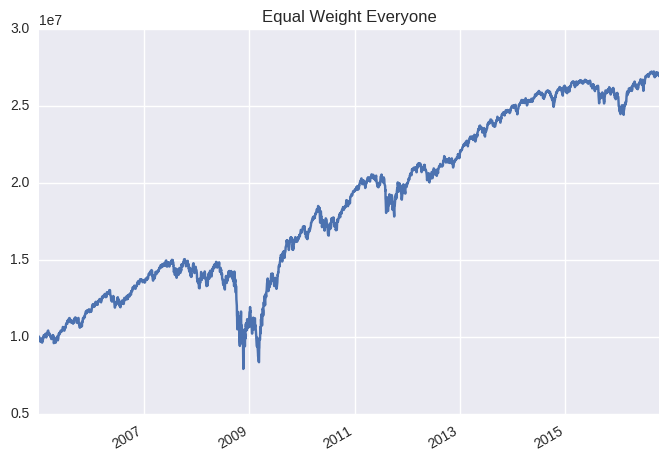

In [4]:
import sim
_,B = sim.sim(U)
#plot NAV
B.NAV.plot(title='Equal Weight Everyone')

Entire data start date: 2005-01-03
Entire data end date: 2016-10-14


Backtest Months: 141


/usr/lib64/python2.7/site-packages/scipy/stats/_stats_mstats_common.py:94: RuntimeWarning: invalid value encountered in absolute
  prob = 2 * distributions.t.sf(np.abs(t), df)


Performance statistics,Backtest
annual_return,0.09
annual_volatility,0.18
sharpe_ratio,0.56
calmar_ratio,0.18
stability_of_timeseries,0.95
max_drawdown,-0.47
omega_ratio,1.14
sortino_ratio,0.81
skew,0.51
kurtosis,24.58


Worst Drawdown Periods,net drawdown in %,peak date,valley date,recovery date,duration
0,47.43,2007-10-09,2008-11-20,2009-08-04,476
1,13.32,2011-04-29,2011-10-03,2012-01-25,194
2,10.40,2010-04-23,2010-07-06,2010-11-02,138
3,8.76,2006-05-08,2006-06-13,2006-10-12,114
4,8.52,2015-05-18,2016-02-11,2016-06-08,278




[-0.022 -0.046]


/usr/lib64/python2.7/site-packages/matplotlib/scale.py:101: RuntimeWarning: invalid value encountered in less_equal
  a[a <= 0.0] = 1e-300


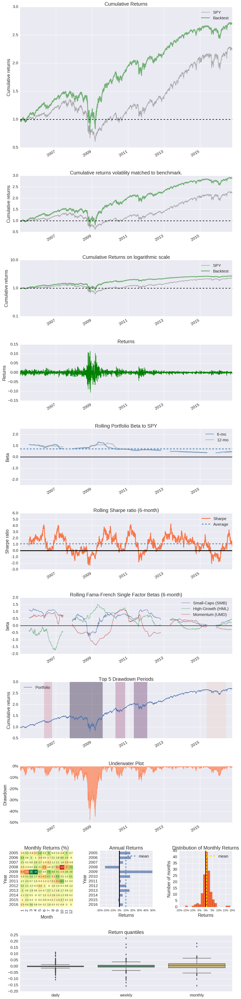

Stress Events,mean,min,max
Lehmann,-0.08%,-6.10%,3.96%
US downgrade/European Debt Crisis,-0.03%,-4.36%,3.15%
Fukushima,0.09%,-0.76%,0.87%
EZB IR Event,-0.02%,-0.73%,0.66%
Aug07,0.06%,-2.10%,1.71%
Mar08,0.15%,-1.98%,3.27%
Sept08,-0.28%,-6.10%,3.96%
2009Q1,-0.41%,-6.36%,6.21%
2009Q2,0.67%,-6.54%,10.28%
Flash Crash,-0.16%,-1.92%,3.08%


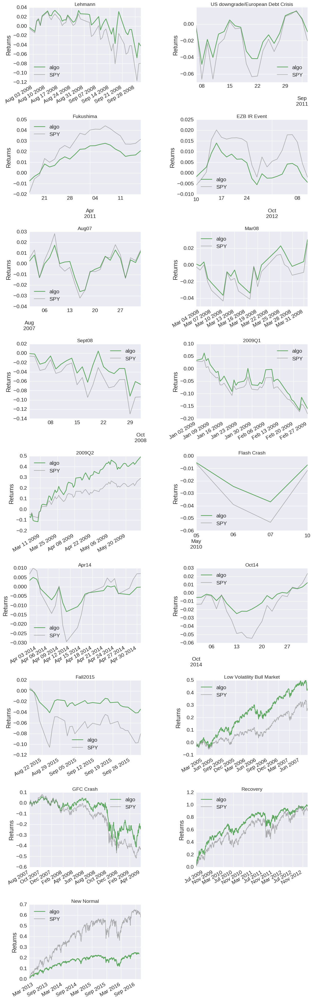

In [5]:
B.index=B.index.tz_localize('UTC')
pf.create_full_tear_sheet(B.NET_Return)

INFO:root:ran over 2971 days and 1913324 rows in 116 secs


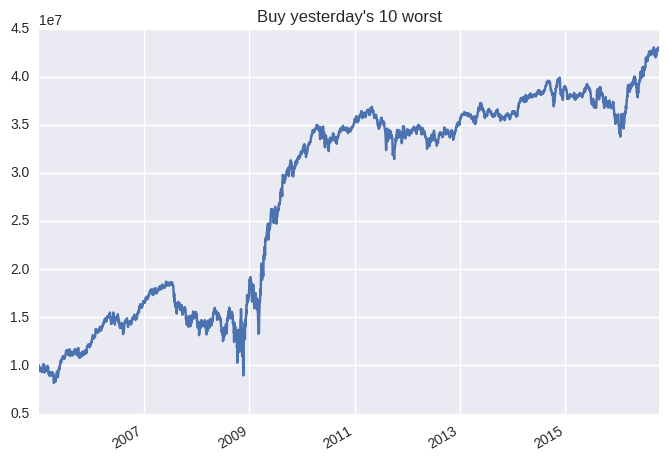

In [6]:
#quandl_auth = os.environ.get('QUANDL_AUTH', 'sCGfc5f6ph5H2wLATVVW')
#SPY = quandl.get("GOOG/NYSE_SPY", authtoken=quandl_auth)
#SPY.Close.plot()

_,Bw = sim.sim(U, sim_FUN=sim.worst_strat)
Bw.NAV.plot(title="Buy yesterday's 10 worst")

Entire data start date: 2005-01-03
Entire data end date: 2016-10-14


Backtest Months: 141


Performance statistics,Backtest
annual_return,0.13
annual_volatility,0.26
sharpe_ratio,0.60
calmar_ratio,0.25
stability_of_timeseries,0.90
max_drawdown,-0.52
omega_ratio,1.16
sortino_ratio,0.95
skew,2.31
kurtosis,46.49


Worst Drawdown Periods,net drawdown in %,peak date,valley date,recovery date,duration
0,52.12,2007-06-04,2008-11-20,2009-01-02,415
1,30.76,2009-01-08,2009-03-06,2009-03-23,53
2,19.15,2005-02-02,2005-04-15,2005-05-31,85
3,15.39,2014-11-24,2016-01-19,2016-04-26,372
4,14.74,2011-05-02,2011-10-03,2013-05-20,536




[-0.032 -0.07 ]


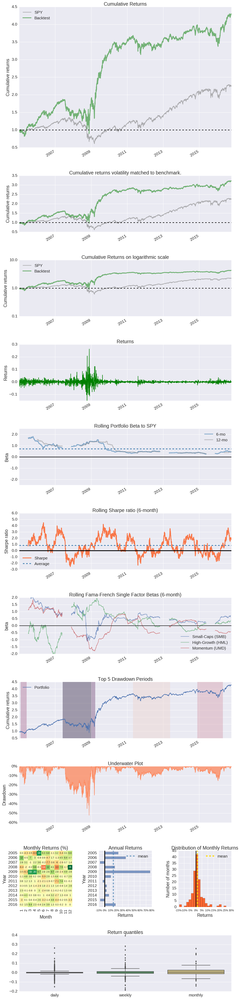

Stress Events,mean,min,max
Lehmann,-0.16%,-10.37%,8.85%
US downgrade/European Debt Crisis,0.00%,-3.71%,4.64%
Fukushima,0.04%,-0.86%,0.76%
EZB IR Event,0.02%,-1.06%,0.73%
Aug07,-0.14%,-3.28%,2.35%
Mar08,0.17%,-3.50%,7.92%
Sept08,-0.52%,-10.37%,8.85%
2009Q1,-0.21%,-7.95%,7.09%
2009Q2,0.80%,-7.70%,12.47%
Flash Crash,0.02%,-1.60%,2.56%


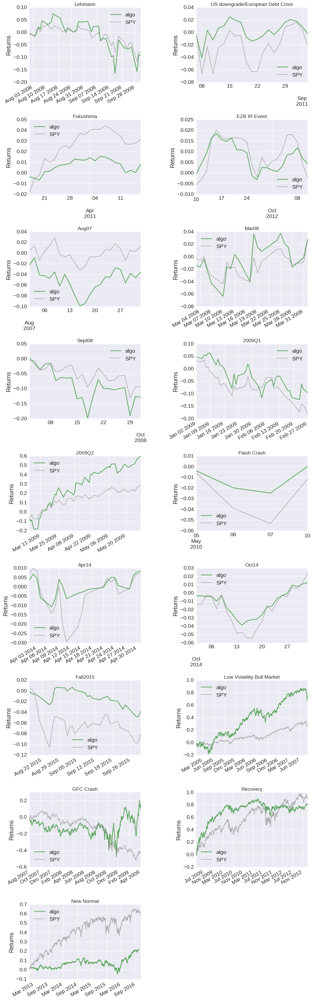

In [7]:
Bw.index=Bw.index.tz_localize('UTC')
pf.create_full_tear_sheet(Bw.NET_Return)

INFO:root:ran over 2971 days and 1913324 rows in 114 secs


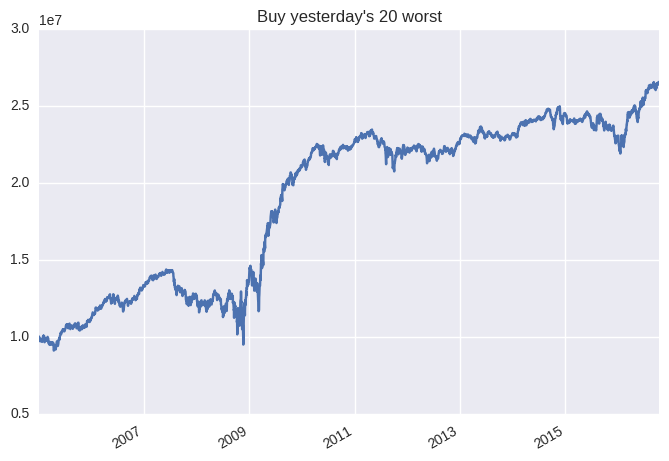

In [8]:
# let's see if we can give the trade more names to 
#   add capacity and reduce vol a bit

kvargs = {'num_names':20}

_,Bw20 = sim.sim(U, sim_FUN=sim.worst_strat ,kvargs=kvargs)
Bw20.NAV.plot(title="Buy yesterday's 20 worst")


Entire data start date: 2005-01-03
Entire data end date: 2016-10-14


Backtest Months: 141


Performance statistics,Backtest
annual_return,0.09
annual_volatility,0.15
sharpe_ratio,0.61
calmar_ratio,0.25
stability_of_timeseries,0.91
max_drawdown,-0.34
omega_ratio,1.15
sortino_ratio,0.95
skew,1.54
kurtosis,30.55


Worst Drawdown Periods,net drawdown in %,peak date,valley date,recovery date,duration
0,33.97,2007-06-04,2008-11-20,2009-01-02,415
1,20.21,2009-01-08,2009-03-06,2009-03-23,53
2,12.30,2014-11-24,2016-01-19,2016-04-26,372
3,11.59,2011-05-02,2011-10-03,2013-05-20,536
4,9.63,2005-02-02,2005-04-15,2005-05-31,85




[-0.019 -0.04 ]


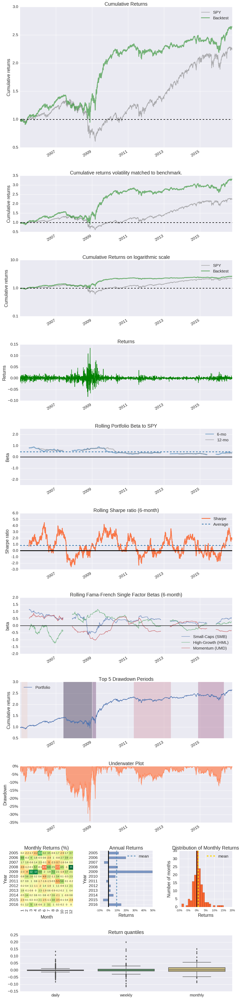

In [9]:
Bw20.index=Bw20.index.tz_localize('UTC')
pf.create_returns_tear_sheet(Bw20.NET_Return)


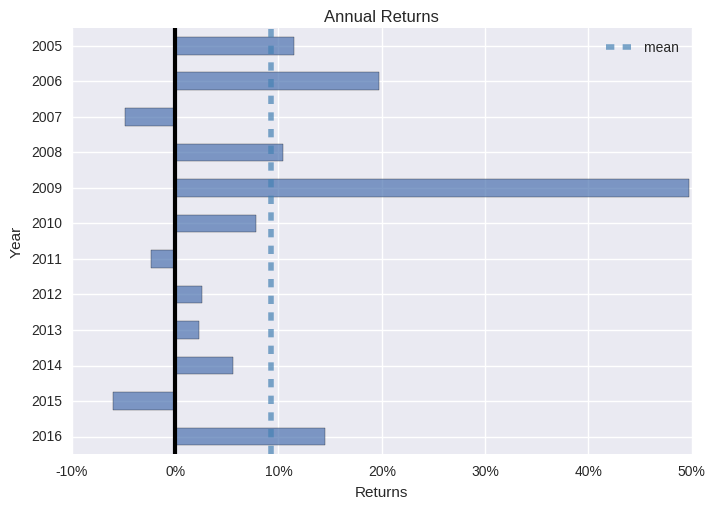

In [10]:
pf.plot_annual_returns(Bw20.NET_Return)
#.create_capacity_tear_sheet(Bw20.NET_Return)

INFO:root:ran over 2971 days and 1913324 rows in 110 secs


Entire data start date: 2005-01-03
Entire data end date: 2016-10-14


Backtest Months: 141


Performance statistics,Backtest
annual_return,0.07
annual_volatility,0.16
sharpe_ratio,0.48
calmar_ratio,0.16
stability_of_timeseries,0.86
max_drawdown,-0.41
omega_ratio,1.12
sortino_ratio,0.74
skew,1.92
kurtosis,40.81


Worst Drawdown Periods,net drawdown in %,peak date,valley date,recovery date,duration
0,40.95,2008-09-19,2009-03-06,2009-04-03,141
1,16.89,2013-10-22,2016-01-19,2016-08-12,734
2,16.47,2008-02-01,2008-07-15,2008-09-03,154
3,10.90,2010-04-23,2011-08-10,2013-05-06,792
4,9.01,2005-01-03,2005-04-28,2005-07-11,136




[-0.02 -0.05]


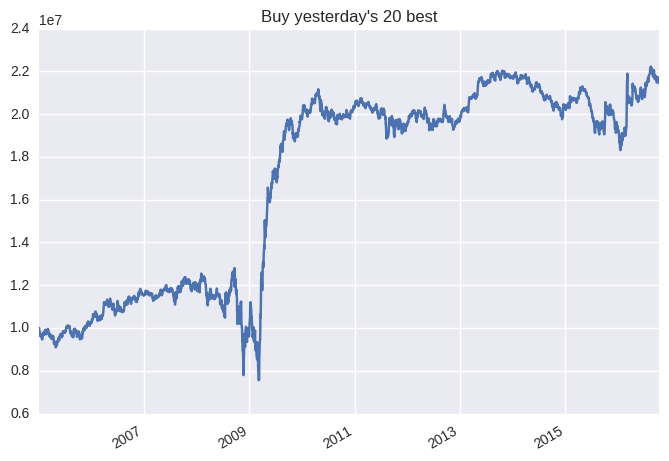

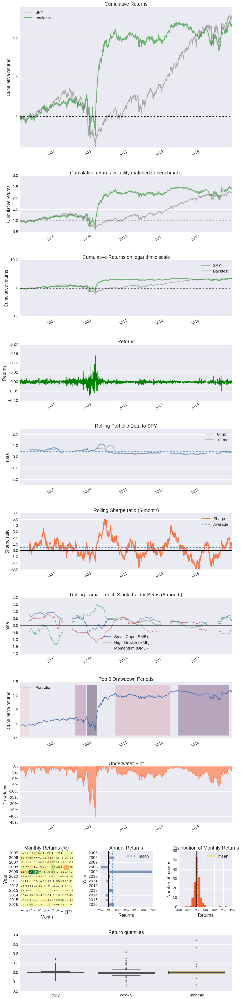

Stress Events,mean,min,max
Lehmann,0.14%,-4.57%,4.96%
US downgrade/European Debt Crisis,-0.01%,-2.40%,2.14%
Fukushima,0.00%,-0.43%,0.69%
EZB IR Event,-0.05%,-0.76%,0.79%
Aug07,0.25%,-1.89%,2.57%
Mar08,-0.15%,-2.20%,2.57%
Sept08,-0.14%,-4.57%,4.96%
2009Q1,-0.26%,-7.79%,9.49%
2009Q2,1.05%,-6.70%,15.15%
Flash Crash,-0.12%,-1.10%,1.41%


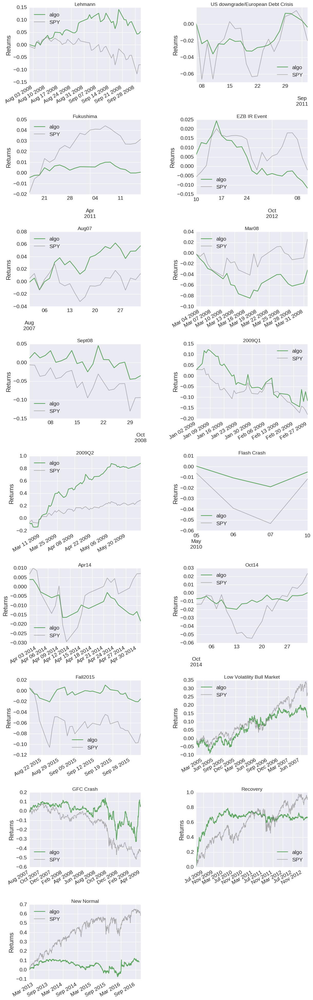

In [11]:
# let's bring the 'best' into this:
kvargs = {'num_names':20}

_,Bb20 = sim.sim(U, sim_FUN=sim.best_strat ,kvargs=kvargs)
Bb20.NAV.plot(title="Buy yesterday's 20 best")
Bb20.index=Bb20.index.tz_localize('UTC')
pf.create_full_tear_sheet(Bb20.NET_Return)


### Ok, so we've seen three basic strategies:

 1. Equal-Weight the universe & rebalance daily.
 2. Buy yesterday's worst.
 3. Buy yesterday's best.

None is especially good: only the second (barely) cracks .6 sharpe, all have vol of > 15% and returns of < 10% and all have suffered wrenching drawdowns.  

However, they've all done broadly better than the S&P in most environments with the unhappy exception of the so-called new normal.

Let's see if we can improve them just a bit as-is and then we'll see if we can apply any of our lessons from machine-learning to improve yet a bit more.

Back in 1990, Andrew Lo and Craig MacKinlay [wrote](http://www.finance.martinsewell.com/stylized-facts/dependence/LoMacKinlay1990.pdf) of a simple 'contrarian' strategy which combines 1, 2 & 3 to create a stat arb strategy.  The gist of it is simple.  Buy the prior period's losers and sell the prior period's winners in proportion to their over- or under-performance of the equal-weighted market.

Let's take a look at that strategy as our candidate target strategy for amelioration with ML techniques.

In [14]:
def eq_wt( U, cfg, kvargs ) :
    # simple, default strategy: equal weight universe on daily basis
    U.Weight = 1/float(len(U.index))
    return U

def bestworst( U,  cfg, kvargs ) :
    # Buy the prior period's losers and sell the prior period's winners in 
    #  proportion to their over- or under-performance of the equal-weighted market.
    N = len(U.index)
    mktR = U.Return.mean()
    Weight = np.add( U.Return, -mktR ) / (-N)
    # now let's ensure that we spend 100% on each side
    U.Weight = 2 * np.sign(Weight) * (abs(Weight) / sum(abs(Weight)))
    return U
    
#aday = U[U.index==U.index.unique()[3]]
#Weight = np.add(aday.Return, -aday.Return.mean())/(-len(aday.index))
#Ws = 2 * np.sign(Weight) * (abs(Weight) / sum(abs(Weight)))

#sum(abs(Ws))
#Ws

INFO:root:ran over 2971 days and 1913324 rows in 117 secs


Entire data start date: 2005-01-03
Entire data end date: 2016-10-14


Backtest Months: 141


Performance statistics,Backtest
annual_return,0.09
annual_volatility,0.11
sharpe_ratio,0.84
calmar_ratio,0.58
stability_of_timeseries,0.94
max_drawdown,-0.15
omega_ratio,1.19
sortino_ratio,1.30
skew,0.83
kurtosis,14.97


Worst Drawdown Periods,net drawdown in %,peak date,valley date,recovery date,duration
0,15.10,2007-05-09,2008-01-23,2008-03-13,222
1,9.04,2008-05-02,2008-07-17,2008-07-31,65
2,8.79,2009-02-12,2009-03-18,2009-04-29,55
3,8.32,2013-02-26,2013-06-24,2014-08-27,392
4,8.06,2006-03-01,2006-09-12,2006-10-30,174




[-0.013 -0.026]


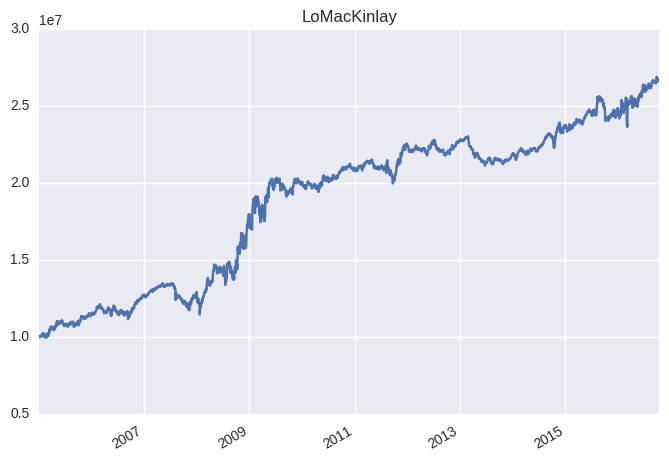

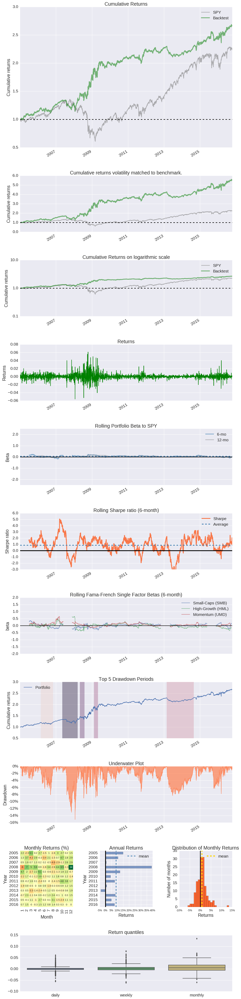

Stress Events,mean,min,max
Lehmann,0.04%,-2.19%,5.56%
US downgrade/European Debt Crisis,-0.11%,-1.52%,2.47%
Fukushima,0.01%,-0.56%,0.33%
EZB IR Event,0.00%,-0.51%,0.58%
Aug07,-0.20%,-2.73%,4.00%
Mar08,0.15%,-1.73%,2.12%
Sept08,0.19%,-2.19%,5.56%
2009Q1,0.18%,-2.62%,4.99%
2009Q2,0.09%,-4.03%,4.67%
Flash Crash,0.08%,-0.52%,1.55%


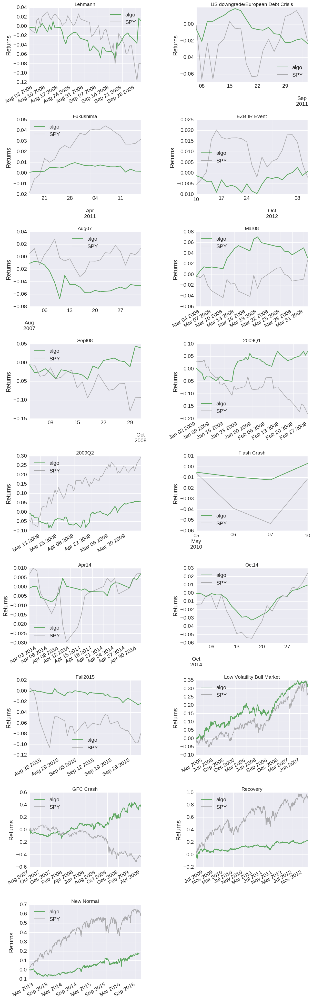

In [15]:
# let's run it
Sbw,Bbw = sim.sim(U, sim_FUN=bestworst)
Bbw.NAV.plot(title="LoMacKinlay")
Bbw.index=Bbw.index.tz_localize('UTC')
pf.create_full_tear_sheet(Bbw.NET_Return)


### there's a reason people like stat arb strats

This is a much better strategy than the others with a sharpe over .8, much lower drawdowns than the others and decent capacity.  But as a cousin, it doesn't escape the family influence: it beats the market most of the time, but not in the recently relevant 'recovery' and 'new normal' phases.  

So, let's see if we can improve this strategy by utilizing the predictive capabilities we'd fostered with tensorflow's random forest implementation.

### How should we attempt to take advantage of the slim edge provided by our nascent ML efforts?

Well, the classifier tells us when it thinks we are headed for a move down, a small move one way or the other, or a move up.  When it tells us that the market is going down, mostly the market stays still or goes down.  

The possibilities are:
 - Good: We're buying something predicted to go up
 - Good: We're selling something predicted to go down
 - OK  : We're buying something predicted to stay flat
 - OK  : We're selling something predicted to stay flat
 - Bad : We're buying something predicted to go down
 - Bad : We're selling something predicted to go up

So, let's leave the *OK*s alone and deallocate from the *Bad*s - say, 50% - and reallocate to the *Goods*.

If we wanted to trade this, we should adjust for liquidity but since we're just playing we'll keep it simple.


## Let's pull-in our ML-prepped data from before, train our model and integrate the results  with our strategy

In [16]:

fname = 'forsims.pkl'
Dataset = collections.namedtuple('Dataset', ['data', 'target'])
forsims = pickle.load(open(fname))
log.info('read %s', fname)

src_train = forsims['src_train']
src_vlad = forsims['src_vlad']
Kvlad = forsims['Kvlad']
forsims = None
Kvlad.head()


INFO:root:read forsims.pkl


,Date,Sym,Open,High,Low,Close,Volume,ADV,DeltaV,Return,SD,DOY,DOW,FSYM,VARATIO,Label
0,2013-01-02,A,0.405279,0.353880,0.387670,0.383876,1.975542,0.520703,1.490640,0.785009,0.517004,2,2,0,3.793989,1
1,2013-01-03,A,0.389501,0.351888,0.418165,0.394153,0.698047,0.712544,-1.011384,0.126517,0.502458,3,3,0,0.979656,2
2,2013-01-04,A,0.403221,0.405693,0.438010,0.451018,0.984417,0.815943,0.267737,0.676711,0.502265,4,4,0,1.206478,1
3,2013-01-07,A,0.434777,0.395729,0.474880,0.429780,-0.211082,0.852129,-1.391474,-0.246512,0.489002,7,0,0,0.247711,0
4,2013-01-08,A,0.425859,0.394400,0.455027,0.406485,-0.081828,0.798381,0.196770,-0.272801,0.493187,8,1,0,0.102492,2


## redefine training method

In [17]:
print Kvlad.shape
print src_vlad.data.shape
print src_train.data.shape


def _fitntestRandomForest( train, vlad, max_nodes=1024, steps=100, model_dir='/tmp/rf') :
    # build fit & test random forest for input
    fsize = len(train.data.columns)
    nclasses = len(train.target.unique())

    hparams = tf.contrib.tensor_forest.python.tensor_forest.ForestHParams(
        num_trees=nclasses, max_nodes=max_nodes, num_classes=nclasses, num_features=fsize)
    classifier = tf.contrib.learn.TensorForestEstimator(hparams)
    
    tdata = train.data.as_matrix().astype(np.float32)
    ttgt = train.target.as_matrix().astype(np.float32)
    vdata = vlad.data.as_matrix().astype(np.float32)
    vtgt = vlad.target.as_matrix().astype(np.float32)

    monitors = [tf.contrib.learn.TensorForestLossMonitor(10, 10)]
    classifier.fit(x=tdata, y=ttgt, steps=steps, monitors=monitors)
    result = classifier.evaluate(x=vdata, y=vtgt)#, steps=np.round(steps/10)

    print('Accuracy: {0:f}'.format(result["accuracy"]))
    return result,classifier



(615664, 16)
(615664, 8)
(2109097, 8)


In [18]:
# let's train our model
src_rf   = _fitntestRandomForest(train=src_train, vlad=src_vlad, model_dir='/tmp/src_rf',steps=100)


INFO:tensorflow:Using config: {'task': 0, 'save_summary_steps': 100, 'keep_checkpoint_max': 5, '_is_chief': True, 'save_checkpoints_secs': 600, 'evaluation_master': '', 'tf_config': gpu_options {
  per_process_gpu_memory_fraction: 1
}
, 'master': '', 'keep_checkpoint_every_n_hours': 10000, '_job_name': None, 'cluster_spec': None, 'tf_random_seed': None, 'num_ps_replicas': 0}
INFO:tensorflow:Using config: {'task': 0, 'save_summary_steps': 100, 'keep_checkpoint_max': 5, '_is_chief': True, 'save_checkpoints_secs': 600, 'evaluation_master': '', 'tf_config': gpu_options {
  per_process_gpu_memory_fraction: 1
}
, 'master': '', 'keep_checkpoint_every_n_hours': 10000, '_job_name': None, 'cluster_spec': None, 'tf_random_seed': None, 'num_ps_replicas': 0}
INFO:tensorflow:Setting feature info to TensorSignature(dtype=tf.float32, shape=TensorShape([Dimension(None), Dimension(8)]), is_sparse=False)
INFO:tensorflow:Setting feature info to TensorSignature(dtype=tf.float32, shape=TensorShape([Dimensio

Accuracy: 0.406191


In [19]:
# now let's use our trained model to fit the validation set
vdata = src_vlad.data.as_matrix().astype(np.float32)
vtgt = src_vlad.target.as_matrix().astype(np.float32)
p=src_rf[1].predict( x=vdata)

# how'd it do?
R = pd.DataFrame( {'predicted':p,'actual':vtgt})
R['dist'] = np.abs(R.actual-R.predicted)

# avg distance is meaningful.  a null predictor should get about .88, 
#  so anything below provides some edge
print R.dist.mean()
twos=R.dist[R.dist==2]
len(twos.index)/float(len(R.index))


Instructions for updating:
The default behavior of predict() is changing. The default value for
as_iterable will change to True, and then the flag will be removed
altogether. The behavior of this flag is described below.
Instructions for updating:
The default behavior of predict() is changing. The default value for
as_iterable will change to True, and then the flag will be removed
altogether. The behavior of this flag is described below.
Instructions for updating:
The default behavior of predict() is changing. The default value for
as_iterable will change to True, and then the flag will be removed
altogether. The behavior of this flag is described below.
Instructions for updating:
The default behavior of predict() is changing. The default value for
as_iterable will change to True, and then the flag will be removed
altogether. The behavior of this flag is described below.
Instructions for updating:
The default behavior of predict() is changing. The default value for
as_iterable will cha

0.713111400604


0.11930208685256893

In [20]:
# ok, let's create a df with date,symbol and prediction which we'll then join onto the simulation dataset
V = pd.DataFrame( {'Date':          Kvlad.Date,
                   'Sym':           Kvlad.Sym,
                   'MLPrediction':  R.predicted })
#Kvlad.head()
print U.shape
print V.shape
V.head()

Uv = U[U.index >= V.Date.min()]
print Uv.shape

Uv.reset_index(inplace=True)
Uv.head()
#V.set_index('Date',inplace=True)

Uml = Uv.merge( V, how='left', on=['Date','Sym'] )
Uml.sort_values(['Date','Sym'],inplace=True)

Uml.set_index('Date',inplace=True)
Uml.head()

(1913324, 19)
(615664, 3)
(615664, 19)


,Sym,Product,Instrument,Multiplier,Expiry,Strike,Open,High,Low,Close,Volume,ADV,DeltaV,Return,Fwd_Close,Fwd_Return,SD,Fwd_Open,Fwd_COReturn,MLPrediction
Date,,,,,,,,,,,,,,,,,,,,
2013-01-02,A,A,STK,1.0,None,None,40.589711,40.589711,39.607935,40.310579,6.287700e+06,3414135.0,0.624395,0.022701,40.454958,0.003575,0.016242,40.368330,0.001433,0
2013-01-02,AA,AA,STK,1.0,None,None,25.758713,26.077797,25.642683,26.077797,7.014933e+06,4996140.0,0.084680,0.035091,26.309857,0.008859,0.013500,26.019782,-0.002225,2
2013-01-02,AAPL,AAPL,STK,1.0,None,None,73.092410,73.248144,71.483590,72.460232,1.401295e+08,151659410.0,-0.162609,0.031185,71.545079,-0.012710,0.024211,72.308457,-0.002095,0
2013-01-02,ABC,ABC,STK,1.0,None,None,41.723424,41.867000,41.369267,41.627706,1.972400e+06,2635575.0,0.420586,0.007154,41.541560,-0.002072,0.008505,41.675565,0.001150,1
2013-01-02,ABT,ABT,STK,1.0,None,None,29.833326,29.971871,29.223728,29.602418,2.026640e+07,14864545.0,0.063573,-0.714753,30.729249,0.037359,0.008568,30.387505,0.026521,2


## we've annoted the simulation dataset with the ML predictions.

## we need to integrate this data into the actual strategy:

In [21]:


def bestworst_ML( U,  cfg, kvargs ) :
    """ Buy the prior period's losers and sell the prior period's winners in 
          proportion to their over- or under-performance of the equal-weighted market.
        Then, cross-reference ML's views with this.  The possibilities are:
         - Good: We're buying something predicted to go up
         - Good: We're selling something predicted to go down
         - OK  : We're buying something predicted to stay flat
         - OK  : We're selling something predicted to stay flat
         - Bad : We're buying something predicted to go down
         - Bad : We're selling something predicted to go up

         We leave the *OK*s alone and deallocate from the *Bad*s according to 
         value in kvargs 'realloc' and reallocate to the *Goods*.
    """    
    realloc = kvargs.get('realloc', 0.5)
    N = len(U.index)
    mktR = U.Return.mean()
    Weight = np.add( U.Return, -mktR ) / (-N)
    # now let's ensure that we spend 100% on each side
    U.Weight = 2 * np.sign(Weight) * (abs(Weight) / sum(abs(Weight)))

    # now, let's add-in our ML insights
    # we're going to deallocate from these guys
    bad1 = np.logical_and(U.MLPrediction==0, U.Weight > 0) 
    bad2 = np.logical_and(U.MLPrediction==2, U.Weight < 0)
    bads = np.logical_or(bad1, bad2) 
    lbads = np.logical_and(bads, U.Weight>0)
    sbads = np.logical_and(bads, U.Weight<0)
    
    # and reallocate to these
    good1 = np.logical_and(U.MLPrediction==0, U.Weight < 0)
    good2 = np.logical_and(U.MLPrediction==2, U.Weight > 0)
    goods = np.logical_or( good1, good2 ) 
    lgoods = np.logical_and(goods, U.Weight>0)
    sgoods = np.logical_and(goods, U.Weight<0)
    numlgoods = len(U[lgoods].index)
    numsgoods = len(U[sgoods].index)
    
    # how much weight to add to longs & shorts?
    lwt = U[lbads].Weight.sum() * realloc
    swt = U[sbads].Weight.sum() * realloc

    # let's deallocate from bads
    U.Weight = np.where( bads, U.Weight * (1-realloc),U.Weight)

    # and allocate to goods long & short
    if numlgoods > 0:
        U.Weight = np.where( lgoods, U.Weight + (lwt/numlgoods), U.Weight )
    if numsgoods > 0:
        U.Weight = np.where( sgoods, U.Weight + (swt/numsgoods), U.Weight )

    #    pdb.set_trace()

    return U


In [22]:
# first, what is our baseline over this period?  Let's look at equal-weight and bestworst and then bestworst_ML

_,Beq   = sim.sim(Uml)
_,Bbw   = sim.sim(Uml,sim_FUN=bestworst)
kvargs = {'realloc': 0.5}
_,Bbwml = sim.sim(Uml,sim_FUN=bestworst_ML,kvargs=kvargs)


INFO:root:ran over 956 days and 615664 rows in 37 secs
INFO:root:ran over 956 days and 615664 rows in 38 secs
INFO:root:ran over 956 days and 615664 rows in 49 secs


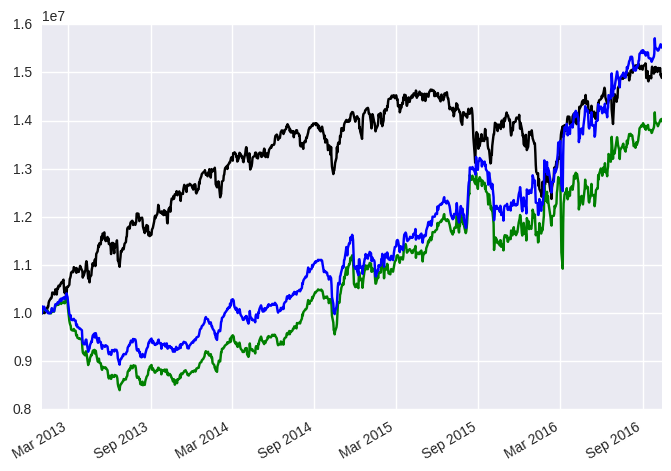

In [23]:

Beq.NAV.plot(color='black')
Bbw.NAV.plot(color='green')
Bbwml.NAV.plot(color='blue')


In [24]:
# let's try reallocating the whole shebang
kvargs = {'realloc': 1}
_,Bbwml1 = sim.sim(Uml,sim_FUN=bestworst_ML,kvargs=kvargs)


INFO:root:ran over 956 days and 615664 rows in 45 secs


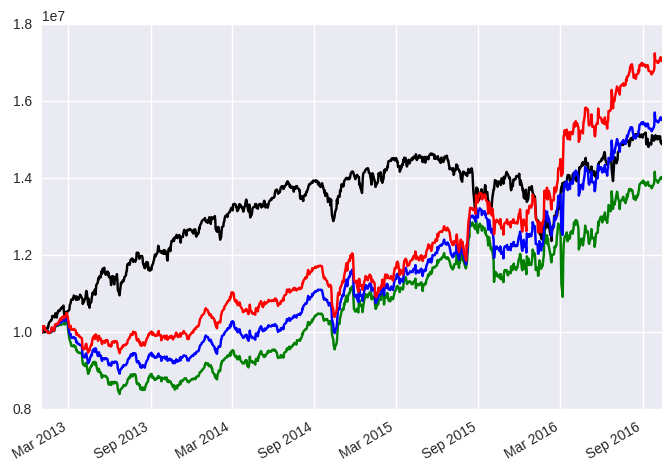

In [25]:
Beq.NAV.plot(color='black')
Bbw.NAV.plot(color='green')
Bbwml.NAV.plot(color='blue')
Bbwml1.NAV.plot(color='red')

def pyfolio_tf ( Balances ):
    Balances.index=Balances.index.tz_localize('UTC')
    pf.create_full_tear_sheet(Balances.NET_Return)
    



0.994299179477
0.694866268424
0.96707850515
1.17649840304
Entire data start date: 2013-01-02
Entire data end date: 2016-10-14


Backtest Months: 45


Performance statistics,Backtest
annual_return,0.15
annual_volatility,0.13
sharpe_ratio,1.18
calmar_ratio,1.34
stability_of_timeseries,0.95
max_drawdown,-0.11
omega_ratio,1.25
sortino_ratio,1.83
skew,0.60
kurtosis,7.69


Worst Drawdown Periods,net drawdown in %,peak date,valley date,recovery date,duration
0,11.34,2014-09-15,2014-10-16,2014-11-11,42
1,9.97,2013-02-26,2013-06-24,2013-12-30,220
2,9.49,2014-11-24,2015-01-16,2015-04-14,102
3,7.94,2015-09-04,2015-10-27,2016-01-26,103
4,7.04,2015-06-17,2015-08-05,2015-08-10,39




[-0.015 -0.032]


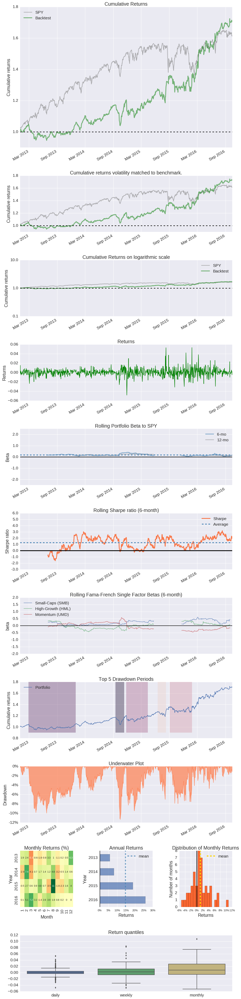

Stress Events,mean,min,max
Apr14,0.06%,-1.22%,1.41%
Oct14,-0.02%,-2.58%,1.65%
Fall2015,-0.02%,-1.40%,3.73%
New Normal,0.06%,-4.81%,5.33%


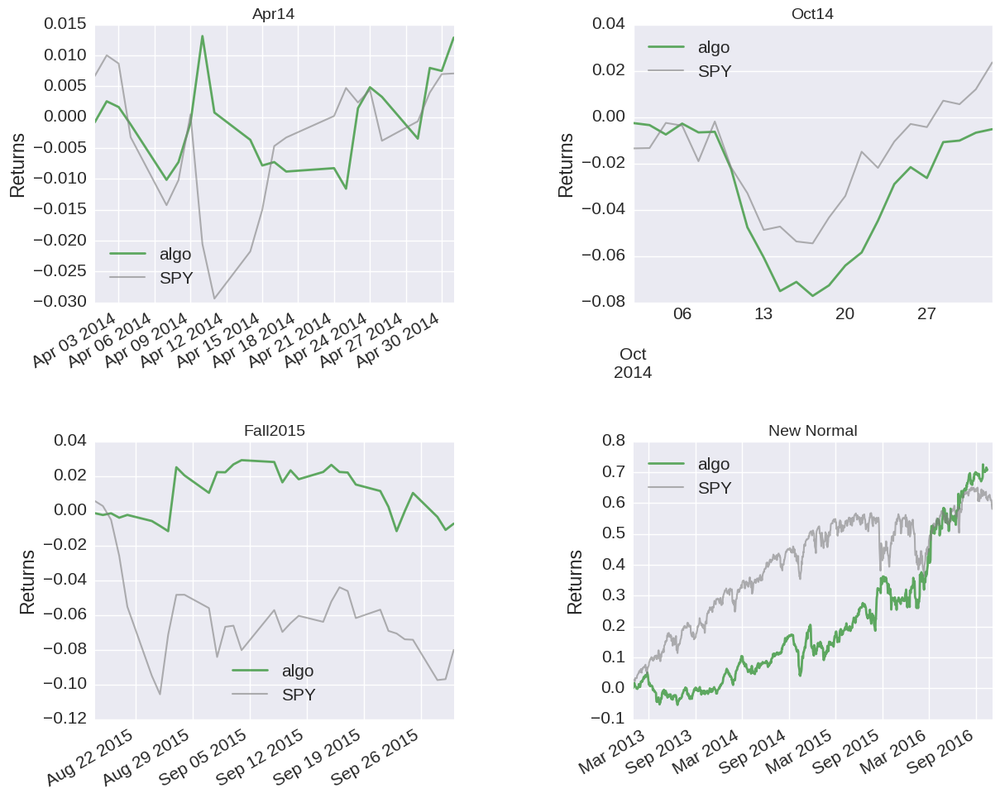

In [26]:
print sim.sharpe(Beq.NET_Return)
print sim.sharpe(Bbw.NET_Return)
print sim.sharpe(Bbwml.NET_Return)
print sim.sharpe(Bbwml1.NET_Return)

pyfolio_tf(Bbwml1)


## That seems a pretty compelling result.

The market since 2013 has been odd - the 'new normal.'  Simply equal-weighting this upward trending period yields a stout .99 Sharpe while the (long/short) baseline **bestworst** strat struggled to reach .70.  Adding the quite limited edge from the random forest model improved things, though how much depends on how heavily you trusted its results.  If you trust it about the same as the **bestworst** model, it improve the ratio to a .95 ratio.  Trusting it entirely such that it over-rides the **bestworst** model in disagreements yields a 1.16 ratio with annual returns of 14% and volatility of 12%.

## Let's see about a strategy which is equal weighting the ML's predictions

### what might that look like?

Let's say we want to maintain market neutrality or something like market neutrality, eg $ neutrality as with **bestworst** and **bestworst_ML**


